# Business Understanding

#### Expliquer les éléments métiers et problématiques à résoudre :


*Tictactrip* est une entreprise de réservation et de comparation de prix de billets de transport en ligne,
qui permet aux utilisateurs de réserver des billets de train, de bus et de 
covoiturage ou combiner les trois avec un prix idéal.
Afin d'optimiser ses services, l'entreprise a décidé de procéder à une analyse
de ses données pour comprendre les tendances de réservation de billets en 
fonction de la distance parcourue, des différents modes de transport, et 
des prix et durées moyens des trajets.

Le but de cet exercice consiste à comprendre les habitudes de réservation de 
billets de transport en ligne de l'entreprise tictactrip. 
Pour cela, nous procédons à une analyse approfondie des données en fonction 
de plusieurs critères tels que la ville, les tickets, les fournisseurs, les 
stations...

Le but de cet exercice est d'extraire des informations clés pour mieux comprendre
et aboutir à notre objectif. Cette analyse me permettra de répondre à plusieurs 
questions commerciales importantes, telles que : 
* Quels sont les tarifs moyens et les durées de trajet pour différents modes de
transport ? 
* Comment les prix moyens et les durées de trajet varient-ils en fonction de la 
distance parcourue ? 
* Quelles sont les différences entre les modes de transport en termes de prix et
 de durée pour différentes distances parcourues ?

#### Le contenu des DataSets :



Dans le cadre de notre exercice de data crunching chez **Tictactrip**, 
nous avons travaillé avec quatre ensembles de données distincts, à savoir : 

*cities, stations, providers, ticket_data.*

La 1 ère dataset:**Cities**: Cet ensemble de données contient des informations 
sur les différentes villes desservies par Tictactrip. Il comprend des 
informations telles que l'ID de la ville,local name (l'adresse), unique name 
(le nom de la ville), la population et la latitude/longitude.

la 2ème dataset: **Stations** : Cet ensemble de données fournit des informations 
sur les différentes gares desservies par les trains de Tictactrip. Il comprend 
des informations telles que l'ID de chaque station, unique name (le nom de chaque
station) et sa latitude/longitude.

La 3ème dataset: **Providers** : Cet ensemble de données fournit des informations 
sur les différents fournisseurs de transport qui travaillent avec Tictactrip. 
Il comprend des informations telles que:

- l'ID: l'identifiant unique de chaque fournisseur
- company_id : il s'agit de l'identifiant unique de l'entreprise à laquelle appartient le fournisseur.
- provider_id : il s'agit de l'identifiant unique du fournisseur dans la base de données de Tictactrip.
- name : le nom du fournisseur de transport.
- fullname : le nom complet du fournisseur de transport.
- has_wifi : cette colonne indique si le fournisseur propose une connexion Wi-Fi.
- has_plug : cette colonne indique s'il existe des prises électriques à bord de ses véhicules.
- has_adjustable_seats : cette colonne indique s'il y a des sièges ajustables dans les véhicules.
- has_bicycle : cette colonne indique si le fournisseur permet aux passagers de transporter des vélos à bord de ses véhicules.
- transport_type : cette colonne indique le type de transport proposé par le fournisseur.

La 4 ème dataset: **ticket_data**: contient des informations sur les billets vendus par 
Tictactrip pour différents trajets. Elle comprend les colonnes suivantes
- id : L'identifiant unique de chaque billet.
- company : cette colonne indique le fournisseur de transport qui propose le trajet couvert par le billet.
- o_station : l'ID de la gare de départ.
- d_station : l'ID de la gare d'arrivée.
- departure_ts :la date et l'heure de départ du trajet.
- arrival_ts :la date et l'heure d'arrivée du trajet.
- price_in_cents :le prix du billet en centimes d'euros.
- search_ts :la date et l'heure à laquelle le billet a été recherché.
- middle_stations : cette colonne indique les éventuelles gares intermédiaires où le véhicule s'arrête.
- other_companies : cette colonne indique les autres fournisseurs de transport qui proposent des trajets similaires.
- o_city :la ville de départ.
- d_city :la ville d'arrivée.






# Data understanding & preparation

*Importation packages :*

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import folium
from folium.plugins import MarkerCluster
from geopy.distance import distance
from datetime import * 

*Importation des datasets*

In [2]:
df_stations = pd.read_csv('stations.csv')
df_cities = pd.read_csv('cities.csv')
df_providers = pd.read_csv('providers.csv')
df_ticket_data = pd.read_csv('ticket_data.csv')

Dans les prochaines lignes de code, j'ai essayé de collecter et prendre note sur les informations des datasets 

In [3]:
df_stations.head()

,id,unique_name,latitude,longitude
0,1,Aalen (Stuttgarter Straße),48.835296,10.092956
1,2,Aéroport Bordeaux-Mérignac,44.830226,-0.700883
2,3,Aéroport CDG,49.009900,2.559310
3,4,Aéroport de Berlin-Schönefeld,52.389446,13.520345
4,5,Aéroport de Dresden,51.123604,13.764737


In [4]:
df_stations.info() #ce dataset est simple, il n'existe pas de valeur nulle

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11035 entries, 0 to 11034
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           11035 non-null  int64  
 1   unique_name  11035 non-null  object 
 2   latitude     11035 non-null  float64
 3   longitude    11035 non-null  float64
dtypes: float64(2), int64(1), object(1)
memory usage: 345.0+ KB


In [5]:
df_cities.head()

,id,local_name,unique_name,latitude,longitude,population
0,5159,"Padua, Veneto, Italia",padua,45.406435,11.876761,209678.0
1,76,"Barcelona, Cataluña, España",barcelona,41.385064,2.173404,1611822.0
2,81,"Basel, Basel-Stadt, Schweiz",basel,47.593437,7.619812,NaN
3,259,"Erlangen, Bayern, Deutschland",erlangen,49.589674,11.011961,105412.0
4,11979,"Balș, Olt, România",balș,44.353354,24.095672,NaN


In [37]:
df_cities.info() #De même pour ce dataset. Il est vrai que la colonne population contient plusieurs valeurs nulles, cependant elles ne sont pas aussi importantes.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8040 entries, 0 to 8039
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           8040 non-null   int64  
 1   local_name   8040 non-null   object 
 2   unique_name  8039 non-null   object 
 3   latitude     8040 non-null   float64
 4   longitude    8040 non-null   float64
 5   population   369 non-null    float64
dtypes: float64(3), int64(1), object(2)
memory usage: 377.0+ KB


In [7]:
df_providers.head()


,id,company_id,provider_id,name,fullname,has_wifi,has_plug,has_adjustable_seats,has_bicycle,transport_type
0,9,1,NaN,ouibus,Ouibus,True,True,True,False,bus
1,10,2,NaN,deinbus,Deinbus.de,False,False,False,False,bus
2,11,3,NaN,infobus,Infobus,False,False,False,False,bus
3,12,4,NaN,studentAgency,Student Agency,False,False,False,False,bus
4,13,5,NaN,flixbus,Flixbus,True,False,False,False,bus


In [8]:
df_providers.info()
df_providers['company_id'].value_counts()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227 entries, 0 to 226
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   id                    227 non-null    int64 
 1   company_id            227 non-null    int64 
 2   provider_id           213 non-null    object
 3   name                  227 non-null    object
 4   fullname              227 non-null    object
 5   has_wifi              224 non-null    object
 6   has_plug              224 non-null    object
 7   has_adjustable_seats  224 non-null    object
 8   has_bicycle           224 non-null    object
 9   transport_type        227 non-null    object
dtypes: int64(2), object(8)
memory usage: 17.9+ KB


9     201
10     11
20      4
1       1
2       1
3       1
4       1
5       1
6       1
8       1
11      1
30      1
40      1
12      1
Name: company_id, dtype: int64

Dans la suite de mon travail, le dataframe providers est très importante, elle ne contient qu'une seule valeur nulle. On remarque que le numéro 9 est très répétitif, donc la compagnie 9 a plusieurs sous compagnies.


In [9]:
df_ticket_data.head()

,id,company,o_station,d_station,departure_ts,arrival_ts,price_in_cents,search_ts,middle_stations,other_companies,o_city,d_city
0,6795025,8385,NaN,NaN,2017-10-13 14:00:00+00,2017-10-13 20:10:00+00,4550,2017-10-01 00:13:31.327+00,NaN,NaN,611,542
1,6795026,9,63.0,1044.0,2017-10-13 13:05:00+00,2017-10-14 06:55:00+00,1450,2017-10-01 00:13:35.773+00,"{149,418}",{13},611,542
2,6795027,8377,5905.0,6495.0,2017-10-13 13:27:00+00,2017-10-14 21:24:00+00,7400,2017-10-01 00:13:40.212+00,"{798,798,6794,6246}","{8377,8376}",611,542
3,6795028,8377,5905.0,6495.0,2017-10-13 13:27:00+00,2017-10-14 11:02:00+00,13500,2017-10-01 00:13:40.213+00,"{798,798,6794,6246}","{8377,8376}",611,542
4,6795029,8381,5905.0,6495.0,2017-10-13 21:46:00+00,2017-10-14 19:32:00+00,7710,2017-10-01 00:13:40.213+00,"{5983,5983}",{8380},611,542


In [10]:
df_ticket_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74168 entries, 0 to 74167
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               74168 non-null  int64  
 1   company          74168 non-null  int64  
 2   o_station        32727 non-null  float64
 3   d_station        32727 non-null  float64
 4   departure_ts     74168 non-null  object 
 5   arrival_ts       74168 non-null  object 
 6   price_in_cents   74168 non-null  int64  
 7   search_ts        74168 non-null  object 
 8   middle_stations  32727 non-null  object 
 9   other_companies  32727 non-null  object 
 10  o_city           74168 non-null  int64  
 11  d_city           74168 non-null  int64  
dtypes: float64(2), int64(5), object(5)
memory usage: 6.8+ MB


In [11]:
df_ticket_data['company'].value_counts()

8385    41441
8376     8654
13       7433
8380     6763
9        3560
8377     2193
8371     1607
8384      796
8372      725
8382      509
71        252
8379      170
8387       16
216        16
8381       14
10          9
12          5
173         3
192         1
33          1
Name: company, dtype: int64

Le dataframe ticket est intéressante, les features présents dans Ticket_data sont fondamentaux. La compagnie qui possède l'ID:8385 a vendu le plus de ticket par rapport aux autres compagnies. Voici quelques modifications qu'on pourrait faire pour faciliter notre analyse

In [12]:
df_ticket_data['price_in_euros']=df_ticket_data['price_in_cents']/100 # j'ai ajouter une colonne de prix en euros pour que ça soit plus simple à analyser.

In [50]:
print('le prix de 50% des tickets est inférieur à '+ str(df_ticket_data['price_in_euros'].describe()['50%'])+' €')
print('le prix moyen des tickets est : '+ str(df_ticket_data['price_in_euros'].describe()['mean'])+' €')
print('le prix minimum des tickets est : '+ str(df_ticket_data['price_in_euros'].describe()['min'])+' €')
print('le prix maximum des tickets est : '+ str(df_ticket_data['price_in_euros'].describe()['max'])+' €')

le prix de 50% des tickets est inférieur à 33.5 €
le prix moyen des tickets est : 43.82711061374177 €
le prix minimum des tickets est : 3.0 €
le prix maximum des tickets est : 385.5 €


In [16]:
#Avant de pouvoir calculer la durée de chaque trajet, j'ai eu recours à un petit data cleaning, j'ai enlever '+00' des colonnes departure_ts et arrival_ts
for n in range(len(df_ticket_data)):
        df_ticket_data.arrival_ts.loc[n]=(df_ticket_data.arrival_ts.loc[n])[0:-3]
        df_ticket_data.departure_ts.loc[n]=(df_ticket_data.departure_ts.loc[n])[0:-3]

df_ticket_data

<ipython-input-16-079ee8d21dc4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ticket_data.arrival_ts.loc[n]=(df_ticket_data.arrival_ts.loc[n])[0:-3]
<ipython-input-16-079ee8d21dc4>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ticket_data.departure_ts.loc[n]=(df_ticket_data.departure_ts.loc[n])[0:-3]


,id,company,o_station,d_station,departure_ts,arrival_ts,price_in_cents,search_ts,middle_stations,other_companies,o_city,d_city,price_in_euros
0,6795025,8385,NaN,NaN,2017-10-13 14:00:00,2017-10-13 20:10:00,4550,2017-10-01 00:13:31.327+00,NaN,NaN,611,542,45.5
1,6795026,9,63.0,1044.0,2017-10-13 13:05:00,2017-10-14 06:55:00,1450,2017-10-01 00:13:35.773+00,"{149,418}",{13},611,542,14.5
2,6795027,8377,5905.0,6495.0,2017-10-13 13:27:00,2017-10-14 21:24:00,7400,2017-10-01 00:13:40.212+00,"{798,798,6794,6246}","{8377,8376}",611,542,74.0
3,6795028,8377,5905.0,6495.0,2017-10-13 13:27:00,2017-10-14 11:02:00,13500,2017-10-01 00:13:40.213+00,"{798,798,6794,6246}","{8377,8376}",611,542,135.0
4,6795029,8381,5905.0,6495.0,2017-10-13 21:46:00,2017-10-14 19:32:00,7710,2017-10-01 00:13:40.213+00,"{5983,5983}",{8380},611,542,77.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
74163,6869182,13,279.0,10729.0,2017-10-27 02:30:00,2017-10-27 16:00:00,2590,2017-10-19 10:35:42.943+00,"{408,408}",{8371},628,562,25.9
74164,6869185,9,279.0,304.0,2017-10-27 07:00:00,2017-10-27 13:30:00,2700,2017-10-19 10:35:42.943+00,"{1105,1105}",{9},628,562,27.0
74165,6869187,8371,10642.0,304.0,2017-10-27 08:30:00,2017-10-27 15:15:00,3000,2017-10-19 10:35:42.943+00,"{1105,1105}",{9},628,562,30.0
74166,6869189,13,279.0,304.0,2017-10-27 13:25:00,2017-10-27 21:10:00,2880,2017-10-19 10:35:42.943+00,"{863,863}",{13},628,562,28.8


In [17]:
df_ticket_data['time_min']=0 #initialiser à 0 afin de créer une variable numérique (int)
# Temps passé en minute pour le trajet 
for n in range(len(df_ticket_data)):
      df_ticket_data.time_min.loc[n]=(datetime.strptime(df_ticket_data.arrival_ts.loc[n], "%Y-%m-%d %H:%M:%S")-datetime.strptime(df_ticket_data.departure_ts.loc[n], "%Y-%m-%d %H:%M:%S")).total_seconds()/60
df_ticket_data

<ipython-input-17-657082455f02>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ticket_data.time_min.loc[n]=(datetime.strptime(df_ticket_data.arrival_ts.loc[n], "%Y-%m-%d %H:%M:%S")-datetime.strptime(df_ticket_data.departure_ts.loc[n], "%Y-%m-%d %H:%M:%S")).total_seconds()/60


,id,company,o_station,d_station,departure_ts,arrival_ts,price_in_cents,search_ts,middle_stations,other_companies,o_city,d_city,price_in_euros,time_min
0,6795025,8385,NaN,NaN,2017-10-13 14:00:00,2017-10-13 20:10:00,4550,2017-10-01 00:13:31.327+00,NaN,NaN,611,542,45.5,370
1,6795026,9,63.0,1044.0,2017-10-13 13:05:00,2017-10-14 06:55:00,1450,2017-10-01 00:13:35.773+00,"{149,418}",{13},611,542,14.5,1070
2,6795027,8377,5905.0,6495.0,2017-10-13 13:27:00,2017-10-14 21:24:00,7400,2017-10-01 00:13:40.212+00,"{798,798,6794,6246}","{8377,8376}",611,542,74.0,1917
3,6795028,8377,5905.0,6495.0,2017-10-13 13:27:00,2017-10-14 11:02:00,13500,2017-10-01 00:13:40.213+00,"{798,798,6794,6246}","{8377,8376}",611,542,135.0,1295
4,6795029,8381,5905.0,6495.0,2017-10-13 21:46:00,2017-10-14 19:32:00,7710,2017-10-01 00:13:40.213+00,"{5983,5983}",{8380},611,542,77.1,1306
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74163,6869182,13,279.0,10729.0,2017-10-27 02:30:00,2017-10-27 16:00:00,2590,2017-10-19 10:35:42.943+00,"{408,408}",{8371},628,562,25.9,810
74164,6869185,9,279.0,304.0,2017-10-27 07:00:00,2017-10-27 13:30:00,2700,2017-10-19 10:35:42.943+00,"{1105,1105}",{9},628,562,27.0,390
74165,6869187,8371,10642.0,304.0,2017-10-27 08:30:00,2017-10-27 15:15:00,3000,2017-10-19 10:35:42.943+00,"{1105,1105}",{9},628,562,30.0,405
74166,6869189,13,279.0,304.0,2017-10-27 13:25:00,2017-10-27 21:10:00,2880,2017-10-19 10:35:42.943+00,"{863,863}",{13},628,562,28.8,465


In [18]:
df_ticket_data['time_min'].describe()

count    74168.000000
mean       424.620793
std        594.981356
min         20.000000
25%        180.000000
50%        290.000000
75%        480.000000
max      29571.000000
Name: time_min, dtype: float64

In [51]:
print('la durée moyenne des trajets est : '+ str(df_ticket_data['time_min'].describe()['mean'])+' min')
print('la durée minimale des trajets  est : '+ str(df_ticket_data['time_min'].describe()['min'])+' min')
print('la durée maximale des trajets  : '+ str(df_ticket_data['time_min'].describe()['max'])+' min')

la durée moyenne des trajets est : 424.6207933340524 min
la durée minimale des trajets  est : 20.0 min
la durée maximale des trajets  : 29571.0 min


In [20]:
#j'ai créé cette fonction afin de calculer la distance, pour cela j'ai eu recours à la librairie geopy
def find_distance(o_city, d_city):
    
    o_lat=float(df_cities.query("id=="+str(o_city)).latitude)
    o_long=float(df_cities.query("id=="+str(o_city)).longitude)
    d_lat=float(df_cities.query("id=="+str(d_city)).latitude)
    d_long=float(df_cities.query("id=="+str(d_city)).longitude)
    
    loc1 = (o_lat, o_long)
    loc2 = (d_lat, d_long)
    return distance(loc1,loc2)

In [21]:
df_ticket_data['distance']=0.0 #initialiser à 0.0 afin de créer une variable numérique (float)

for n in range(len(df_ticket_data)):
    df_ticket_data.distance.loc[n]=find_distance(df_ticket_data.o_city.loc[n],df_ticket_data.d_city.loc[n])

<ipython-input-21-0fdc91a8beb8>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ticket_data.distance.loc[n]=find_distance(df_ticket_data.o_city.loc[n],df_ticket_data.d_city.loc[n])


In [22]:
df_ticket_data

,id,company,o_station,d_station,departure_ts,arrival_ts,price_in_cents,search_ts,middle_stations,other_companies,o_city,d_city,price_in_euros,time_min,distance
0,6795025,8385,NaN,NaN,2017-10-13 14:00:00,2017-10-13 20:10:00,4550,2017-10-01 00:13:31.327+00,NaN,NaN,611,542,45.5,370,503.1368310487561 km
1,6795026,9,63.0,1044.0,2017-10-13 13:05:00,2017-10-14 06:55:00,1450,2017-10-01 00:13:35.773+00,"{149,418}",{13},611,542,14.5,1070,503.1368310487561 km
2,6795027,8377,5905.0,6495.0,2017-10-13 13:27:00,2017-10-14 21:24:00,7400,2017-10-01 00:13:40.212+00,"{798,798,6794,6246}","{8377,8376}",611,542,74.0,1917,503.1368310487561 km
3,6795028,8377,5905.0,6495.0,2017-10-13 13:27:00,2017-10-14 11:02:00,13500,2017-10-01 00:13:40.213+00,"{798,798,6794,6246}","{8377,8376}",611,542,135.0,1295,503.1368310487561 km
4,6795029,8381,5905.0,6495.0,2017-10-13 21:46:00,2017-10-14 19:32:00,7710,2017-10-01 00:13:40.213+00,"{5983,5983}",{8380},611,542,77.1,1306,503.1368310487561 km
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74163,6869182,13,279.0,10729.0,2017-10-27 02:30:00,2017-10-27 16:00:00,2590,2017-10-19 10:35:42.943+00,"{408,408}",{8371},628,562,25.9,810,339.0467656850624 km
74164,6869185,9,279.0,304.0,2017-10-27 07:00:00,2017-10-27 13:30:00,2700,2017-10-19 10:35:42.943+00,"{1105,1105}",{9},628,562,27.0,390,339.0467656850624 km
74165,6869187,8371,10642.0,304.0,2017-10-27 08:30:00,2017-10-27 15:15:00,3000,2017-10-19 10:35:42.943+00,"{1105,1105}",{9},628,562,30.0,405,339.0467656850624 km
74166,6869189,13,279.0,304.0,2017-10-27 13:25:00,2017-10-27 21:10:00,2880,2017-10-19 10:35:42.943+00,"{863,863}",{13},628,562,28.8,465,339.0467656850624 km


In [23]:
#j'ai fait l'arrondie de la colonne distance pour améliorer l'affichage du kilométrage.
df_ticket_data['distance'] = round(df_ticket_data['distance'].astype(str).str[:-3].astype(float),2)

In [24]:
df_ticket_data 

,id,company,o_station,d_station,departure_ts,arrival_ts,price_in_cents,search_ts,middle_stations,other_companies,o_city,d_city,price_in_euros,time_min,distance
0,6795025,8385,NaN,NaN,2017-10-13 14:00:00,2017-10-13 20:10:00,4550,2017-10-01 00:13:31.327+00,NaN,NaN,611,542,45.5,370,503.14
1,6795026,9,63.0,1044.0,2017-10-13 13:05:00,2017-10-14 06:55:00,1450,2017-10-01 00:13:35.773+00,"{149,418}",{13},611,542,14.5,1070,503.14
2,6795027,8377,5905.0,6495.0,2017-10-13 13:27:00,2017-10-14 21:24:00,7400,2017-10-01 00:13:40.212+00,"{798,798,6794,6246}","{8377,8376}",611,542,74.0,1917,503.14
3,6795028,8377,5905.0,6495.0,2017-10-13 13:27:00,2017-10-14 11:02:00,13500,2017-10-01 00:13:40.213+00,"{798,798,6794,6246}","{8377,8376}",611,542,135.0,1295,503.14
4,6795029,8381,5905.0,6495.0,2017-10-13 21:46:00,2017-10-14 19:32:00,7710,2017-10-01 00:13:40.213+00,"{5983,5983}",{8380},611,542,77.1,1306,503.14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74163,6869182,13,279.0,10729.0,2017-10-27 02:30:00,2017-10-27 16:00:00,2590,2017-10-19 10:35:42.943+00,"{408,408}",{8371},628,562,25.9,810,339.05
74164,6869185,9,279.0,304.0,2017-10-27 07:00:00,2017-10-27 13:30:00,2700,2017-10-19 10:35:42.943+00,"{1105,1105}",{9},628,562,27.0,390,339.05
74165,6869187,8371,10642.0,304.0,2017-10-27 08:30:00,2017-10-27 15:15:00,3000,2017-10-19 10:35:42.943+00,"{1105,1105}",{9},628,562,30.0,405,339.05
74166,6869189,13,279.0,304.0,2017-10-27 13:25:00,2017-10-27 21:10:00,2880,2017-10-19 10:35:42.943+00,"{863,863}",{13},628,562,28.8,465,339.05


In [25]:
#Dans les deux lignes de code suivantes , j'ai fais un merge entre les deux dataframes providers et ticker_data. J'ai eu recours à la colonne ID de providers que j'ai changer par compagnie pour faciliter le merge.
df_providers=df_providers.rename(columns = {'id': 'company'})

In [26]:
df_tic_pro=pd.merge(df_ticket_data,df_providers,left_on='company',right_on='company',how="inner")


In [28]:
# j'ai diviser les distances en 4 classes :0-200km, 201-800km, 800-2000km, 2000+km
df_tic_pro['distance_class'] = pd.cut(df_tic_pro['distance'], bins=[0,200, 500,800, 1000, 2000], include_lowest=True, 
                                 labels=['0-200km', '201-500km', '501-800km', '801-1000km', '1001-2000km'])

In [52]:
df_tic_pro

,id,company,o_station,d_station,departure_ts,arrival_ts,price_in_cents,search_ts,middle_stations,other_companies,...,company_id,provider_id,name,fullname,has_wifi,has_plug,has_adjustable_seats,has_bicycle,transport_type,distance_class
0,6795025,8385,NaN,NaN,2017-10-13 14:00:00,2017-10-13 20:10:00,4550,2017-10-01 00:13:31.327+00,NaN,NaN,...,11,NaN,bbc,Blablacar,False,False,False,False,carpooling,501-800km
1,6795030,8385,NaN,NaN,2017-10-06 05:30:00,2017-10-06 08:30:00,1800,2017-10-01 01:03:18.948+00,NaN,NaN,...,11,NaN,bbc,Blablacar,False,False,False,False,carpooling,201-500km
2,6795031,8385,NaN,NaN,2017-10-06 07:00:42,2017-10-06 09:30:42,2150,2017-10-01 01:03:18.948+00,NaN,NaN,...,11,NaN,bbc,Blablacar,False,False,False,False,carpooling,201-500km
3,6795032,8385,NaN,NaN,2017-10-06 07:10:00,2017-10-06 09:40:00,1700,2017-10-01 01:03:18.948+00,NaN,NaN,...,11,NaN,bbc,Blablacar,False,False,False,False,carpooling,201-500km
4,6795033,8385,NaN,NaN,2017-10-06 10:00:00,2017-10-06 12:50:00,1700,2017-10-01 01:03:18.948+00,NaN,NaN,...,11,NaN,bbc,Blablacar,False,False,False,False,carpooling,201-500km
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74163,6848395,12,283.0,1595.0,2017-10-27 06:00:00,2017-10-27 17:45:00,4687,2017-10-14 19:01:07.915+00,"{561,8813}",{71},...,4,NaN,studentAgency,Student Agency,False,False,False,False,bus,501-800km
74164,6848396,12,283.0,1593.0,2017-10-27 06:00:00,2017-10-27 17:20:00,4777,2017-10-14 19:01:07.915+00,"{561,561}",{71},...,4,NaN,studentAgency,Student Agency,False,False,False,False,bus,501-800km
74165,6852979,12,523.0,86.0,2017-10-30 21:30:00,2017-10-31 11:45:00,1990,2017-10-16 08:10:00.399+00,"{458,458}",{13},...,4,NaN,studentAgency,Student Agency,False,False,False,False,bus,0-200km
74166,6853589,12,283.0,523.0,2017-12-22 18:30:00,2017-12-23 04:25:00,4590,2017-10-16 10:12:35.105+00,"{330,330}",{13},...,4,NaN,studentAgency,Student Agency,False,False,False,False,bus,201-500km


# Analyses & Visualisation

Passons maintenant à l'analyse et la visualisation des données. Que peut-on en tirer?

In [35]:
locations = df_stations[['latitude', 'longitude']]
locationlist = locations.values.tolist()
len(locationlist)

11035

In [36]:
map2 = folium.Map(location=[49.00, 2.55], tiles='Stamen Terrain', zoom_start=10)

marker_cluster = MarkerCluster().add_to(map2)

for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point], popup=df_stations['unique_name'][point], icon=folium.Icon(color='darkblue', icon_color='white', angle=0, prefix='fa')).add_to(marker_cluster)
map2

Voici une data visualisation qui représente une map de toutes les stations qu'on peut traverser avec Tictactrip qui couvre toute l'Europe.

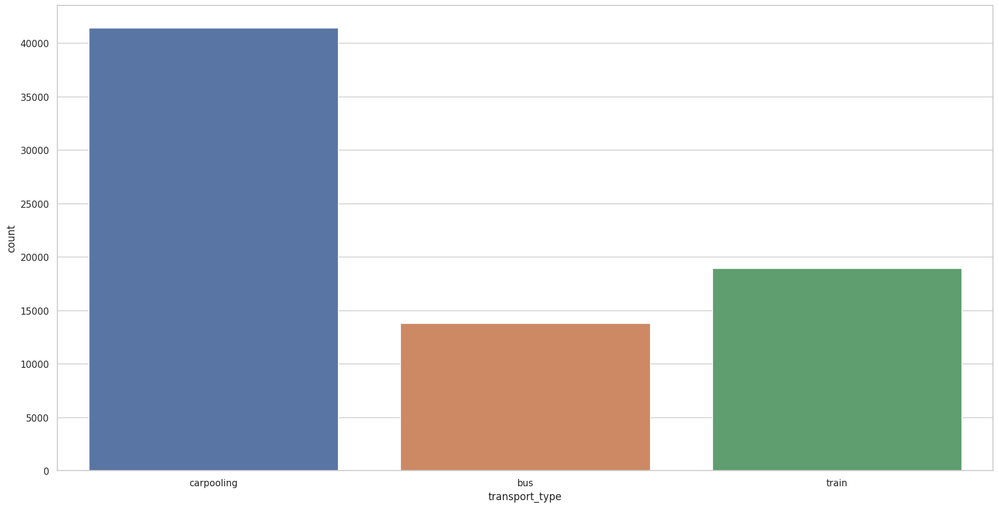

In [53]:
sns.set(style='whitegrid')
plt.figure(figsize=(20,10))
ax = sns.countplot(x='transport_type', data=df_tic_pro)

In [54]:
df_tic_pro['transport_type'].value_counts()

carpooling    41441
train         18929
bus           13798
Name: transport_type, dtype: int64

Dans ce premier graphe, nous remarquons que le type de transport le plus utiliser de tictactrip est le covoiturage avec 41441 tickets vendus.

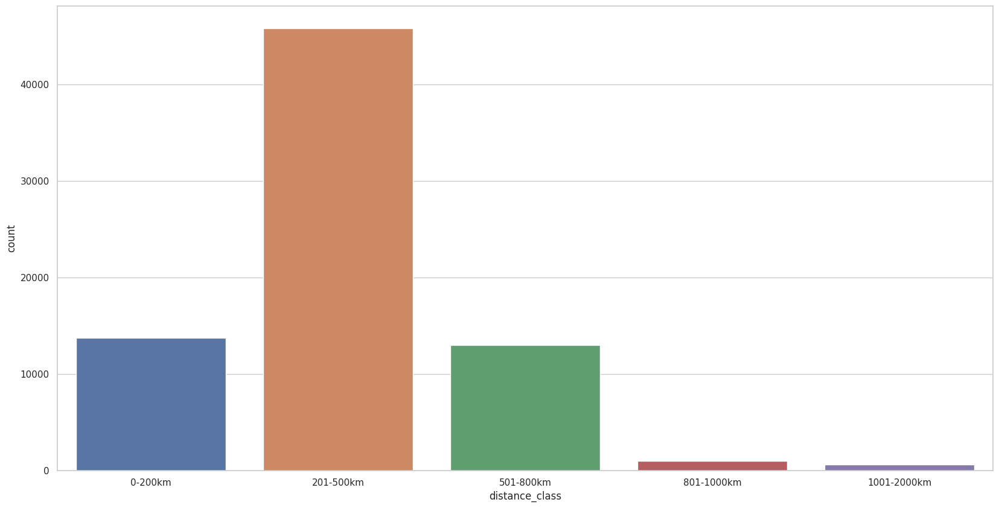

In [30]:
sns.set(style='whitegrid')
plt.figure(figsize=(20,10))
ax = sns.countplot(x='distance_class', data=df_tic_pro)

On remarque la distance entre 201km et 500km est la plus traverser, on distingue alors que la plupart des clients utilise la plateforme Tictactrip pour traverser des distances moyennes

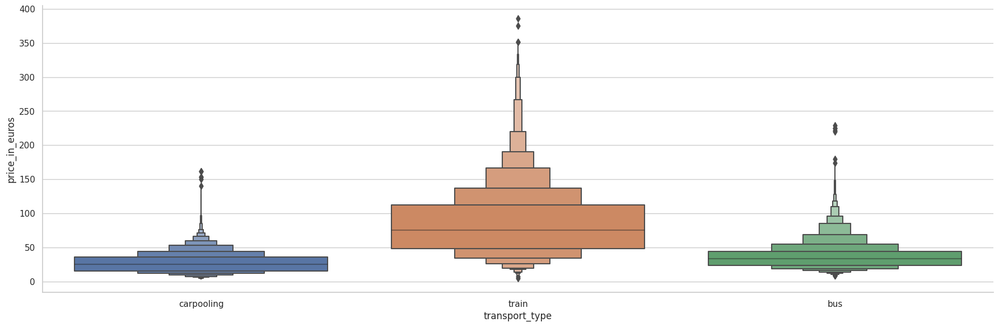

In [31]:
sns.catplot(y = "price_in_euros", x = "transport_type", data = df_tic_pro.sort_values("price_in_euros", ascending = True), kind="boxen", height = 6, aspect = 3)
plt.show()

Ce graphe affiche les prix de chaque moyen de transport, nous pouvons remarquer que le train possède les prix les plus chers, le bus a les prix un peu plus abordable et le covoiturage avec les prix les plus avantageux.

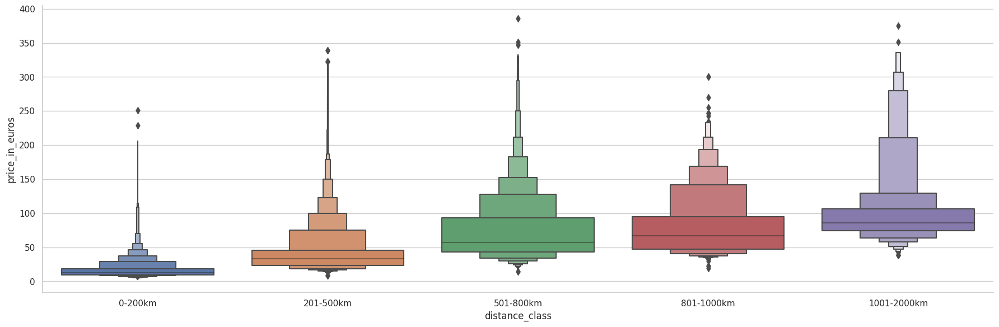

In [55]:
sns.catplot(y = "price_in_euros", x = "distance_class", data = df_tic_pro.sort_values("price_in_euros", ascending = True), kind="boxen", height = 6, aspect = 3)
plt.show()

Ce graphe affiche les prix des ticket en rapport avec les distances. Plus la distance est grande plus le prix moyen du ticket augmente.
Cependant, cela n'empêche l'existance d'outliers.

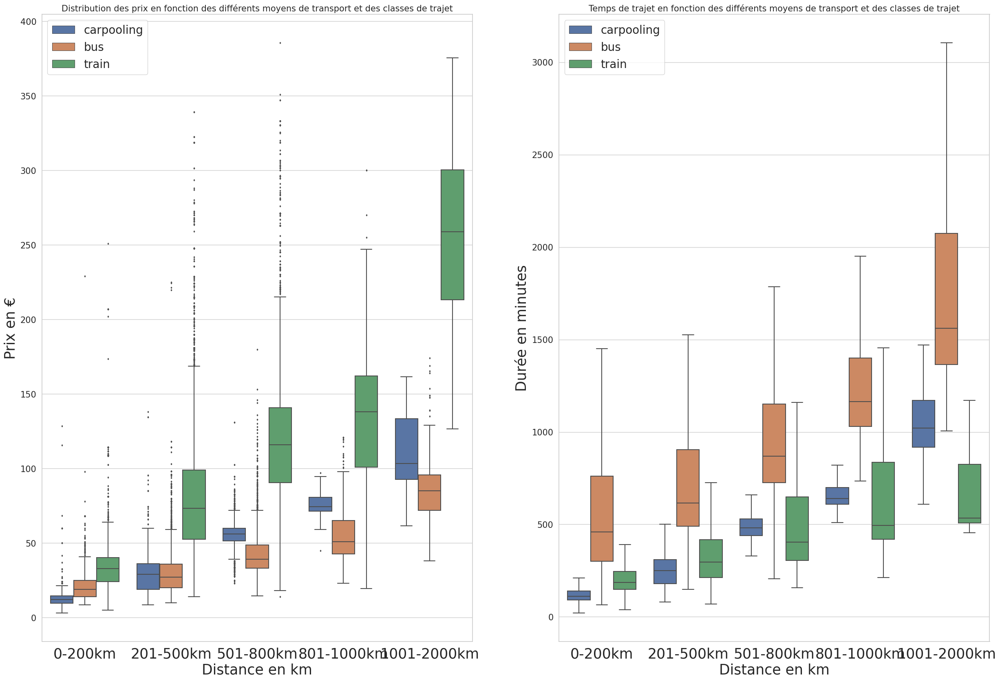

In [57]:

fig, axes = plt.subplots(1, 2, figsize=(30, 20))

ax1 = sns.boxplot(x="distance_class", y="price_in_euros", hue="transport_type", data=df_tic_pro, fliersize = 2, ax = axes[0])
ax1.set_title(label = "Distribution des prix en fonction des différents moyens de transport et des classes de trajet", fontsize = 15)
ax1.set_xlabel(xlabel="Distance en km", fontsize = 25)
ax1.set_ylabel(ylabel="Prix en €", fontsize = 25)
ax1.tick_params(axis='x', labelsize=25)
ax1.tick_params(axis='y', labelsize=15)
ax1.legend(loc=2, prop={'size': 20})

ax2 = sns.boxplot(x="distance_class", y="time_min", hue="transport_type", data=df_tic_pro, showfliers = False, ax = axes[1])
ax2.set_title(label = "Temps de trajet en fonction des différents moyens de transport et des classes de trajet", fontsize = 15)
ax2.set_xlabel(xlabel="Distance en km", fontsize = 25)
ax2.set_ylabel(ylabel="Durée en minutes", fontsize = 25)
ax2.tick_params(axis='x', labelsize=25)
ax2.tick_params(axis='y', labelsize=15)
ax2.legend(loc=2, prop={'size': 20})

plt.show()
     


Pour récapituler et mieux clarifier les résultats des deux graphes, voici deux autres graphes qui représentent la distributon des prix des tickets et la durée du trajet, les deux en fonction des différents moyens de transportet de classes de trajet.

Train :

C'est le moyen de transport le plus cher quelque soit la distance parcourue cependant il est le plus rapide concernant les grandes distances.

Bus :

Evidemment, le bus est le moyen de transport le plus lent et le moins cher concernant les longues distances.

Covoiturage :

C'est le moyens de transport le plus rapide et généralement le mois cher pour les trajets de moins 800km.

Pour conclure, le covoiturage a le meilleur rapport durée/prix indépendamment de la distance.

Text(0.5, 1.0, 'Part de marché en fonction des 5 plus grandes compagnies ')

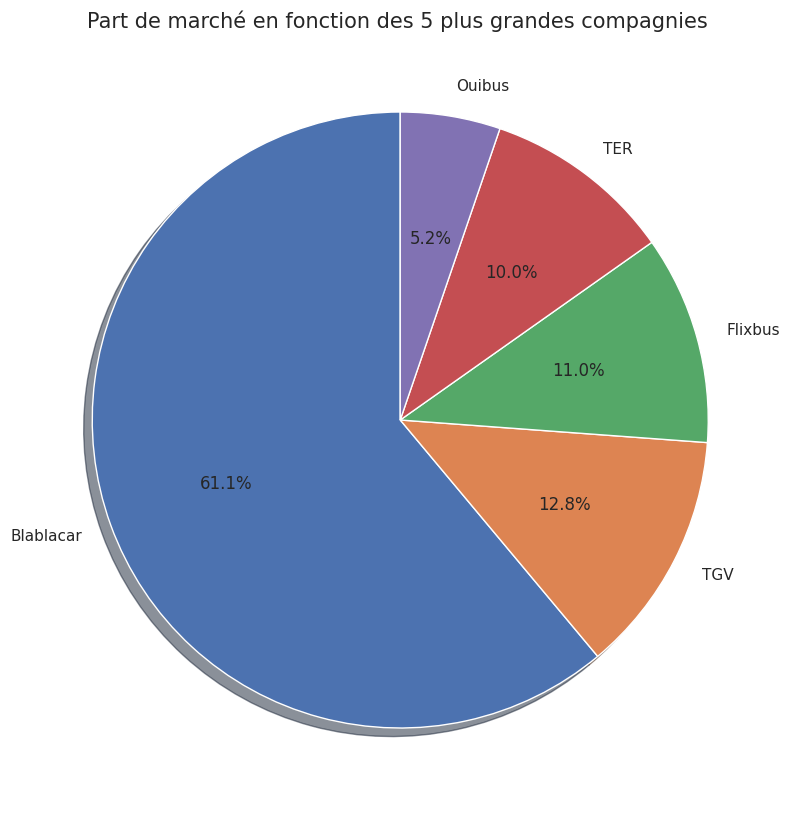

In [33]:
freq_co = df_tic_pro["fullname"].value_counts().sort_values(ascending=False)[:5]
fig, axes = plt.subplots(1, 1, figsize=(20, 10))
axes.pie(freq_co, labels=freq_co.keys(), autopct='%1.1f%%', shadow=True, startangle=90)
axes.set_title("Part de marché en fonction des 5 plus grandes compagnies ", fontsize=15)

D'après notre analyse des graphes précédents, le covoiturage est le moyen de transport le plus commun car c'est celui qui a le rapport qualité/prix le plus avantageux, donc l'entreprise de covoiturage Blablacar a la plus grande part de marché en comparaison avec les autres compagnies avec 61.1%.


# Conclusion

Pour récapituler, comme vous l'avez mentionner auparavant ce travail peut être infini. Alors j'ai utiliser les données que j'ai jugé être les plus pertinentes dans cette analyse pour en tirer le plus d'informations possible qui pourront permettre à Tictactrip d'optimiser son service.